# **AI6128 Project 2 Trajectory and Road Network Data Analysis**

The notebook is created and runned in Google Colab. It's recommended to run the notebook in Colab to avoid any issue.

# TASK 1


1.Download a road network of the Porto City, Portugal

In [ ]:
#Please restart runtime after installation due to matplotlib error
! pip install osmnx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached matplotlib-3.5.3-cp37-cp37m-manylinux_2_5_x86_64.manylinux1_x86_64.whl (11.2 MB)
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.1.3
    Uninstalling matplotlib-3.1.3:
      Successfully uninstalled matplotlib-3.1.3


In [ ]:
import osmnx as ox
import time
from shapely.geometry import Polygon
import os

def save_graph_shapefile_directional(G, filepath=None, encoding="utf-8"):
    # default filepath if none was provided
    if filepath is None:
        filepath = os.path.join(ox.settings.data_folder, "graph_shapefile")

    # if save folder does not already exist, create it (shapefiles
    # get saved as set of files)
    if not filepath == "" and not os.path.exists(filepath):
        os.makedirs(filepath)
    filepath_nodes = os.path.join(filepath, "nodes.shp")
    filepath_edges = os.path.join(filepath, "edges.shp")

    # convert undirected graph to gdfs and stringify non-numeric columns
    gdf_nodes, gdf_edges = ox.utils_graph.graph_to_gdfs(G)
    gdf_nodes = ox.io._stringify_nonnumeric_cols(gdf_nodes)
    gdf_edges = ox.io._stringify_nonnumeric_cols(gdf_edges)
    # We need an unique ID for each edge
    gdf_edges["fid"] = gdf_edges.index
    # save the nodes and edges as separate ESRI shapefiles
    gdf_nodes.to_file(filepath_nodes, encoding=encoding)
    gdf_edges.to_file(filepath_edges, encoding=encoding)

print("osmnx version",ox.__version__)

osmnx version 1.1.2


In [ ]:
!pip install matplotlib==3.1.3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached matplotlib-3.1.3-cp37-cp37m-manylinux1_x86_64.whl (13.1 MB)
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.5.3
    Uninstalling matplotlib-3.5.3:
      Successfully uninstalled matplotlib-3.5.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
osmnx 1.1.2 requires matplotlib>=3.4, but you have matplotlib 3.1.3 which is incompatible.


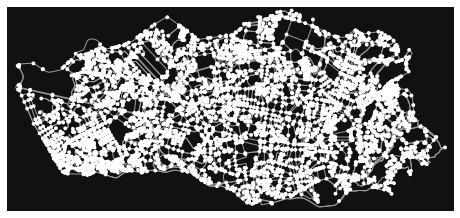

(<Figure size 576x576 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f66a9516850>)

In [ ]:
G = ox.graph_from_place('Porto, Portugal', network_type='drive')
ox.plot_graph(G)

In [ ]:
# Interactive map
ox.folium.plot_graph_folium(G)

From assignment slide:



In [ ]:
#place ="Porto, Portugal"
#G = ox.graph_from_place(place, network_type='drive', which_result=2)
#save_graph_shapefile_directional(G, filepath='porto')

2.download some trajectory data of taxies in the city

retrieve the first 1000 trips in the train.csv dataset for this project.
We call the dataset **train-1000**.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd

create the new .csv file

In [ ]:
pathfile = '/content/drive/MyDrive/Urban2/Data/train/train.csv'

df = pd.read_csv(pathfile, nrows=1000)
df.to_csv('train-1000.csv')

# TASK 2

Visualize the raw GPS points of the first 10 trips in the trajectory data dataset on a map with the road network of Porto.

In [ ]:
df = pd.read_csv('train-1000.csv', usecols = ['POLYLINE'])
points_df = df[:10]
points_df

,POLYLINE
0,"[[-8.618643,41.141412],[-8.618499,41.141376],[..."
1,"[[-8.639847,41.159826],[-8.640351,41.159871],[..."
2,"[[-8.612964,41.140359],[-8.613378,41.14035],[-..."
3,"[[-8.574678,41.151951],[-8.574705,41.151942],[..."
4,"[[-8.645994,41.18049],[-8.645949,41.180517],[-..."
5,"[[-8.615502,41.140674],[-8.614854,41.140926],[..."
6,"[[-8.57952,41.145948],[-8.580942,41.145039],[-..."
7,"[[-8.617563,41.146182],[-8.617527,41.145849],[..."
8,"[[-8.611794,41.140557],[-8.611785,41.140575],[..."
9,"[[-8.615907,41.140557],[-8.614449,41.141088],[..."


mapping(together on one map)

In [ ]:
import ast
import folium as f
import seaborn as sns
palette = sns.color_palette(None, 20).as_hex()
trips = points_df.POLYLINE.apply(lambda x: ast.literal_eval(x)).tolist()
porto = [41.1579,-8.6291]
map = f.Map(location=porto, zoom_start=13)
c = 0
for trip in trips:
  # print(trip)
  
  points = [(i[1], i[0]) for i in trip]
  # print(points)
    # add marker for the start and ending points
  for point in points:
    # f.Marker(point, color = palette[c]).add_to(map)
    # add the points
    f.CircleMarker(point, weight=5, opacity=2, radius=2, color = palette[c]).add_to(map)
  c+=1


map

# Task 3

## Install FMM

In [ ]:
# Update the ppa in order to install required version (2.2) of GDAL.
!sudo add-apt-repository ppa:ubuntugis/ppa
!sudo apt-get -q update

 Official stable UbuntuGIS packages.


 More info: https://launchpad.net/~ubuntugis/+archive/ubuntu/ppa
Press [ENTER] to continue or Ctrl-c to cancel adding it.

Ign:1 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:3 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease
Hit:4 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:5 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Hit:6 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Hit:7 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Hit:10 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:11 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Get:12 http://archive.ubuntu.com/ubuntu bi

In [ ]:
# Install all the requirements
!sudo apt-get install libboost-dev libboost-serialization-dev \
gdal-bin libgdal-dev make cmake libbz2-dev libexpat1-dev swig python-dev

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libboost-dev is already the newest version (1.65.1.0ubuntu1).
make is already the newest version (4.1-9.1ubuntu1).
python-dev is already the newest version (2.7.15~rc1-1).
libboost-serialization-dev is already the newest version (1.65.1.0ubuntu1).
swig is already the newest version (3.0.12-1).
cmake is already the newest version (3.10.2-1ubuntu2.18.04.2).
libbz2-dev is already the newest version (1.0.6-8.1ubuntu0.2).
libexpat1-dev is already the newest version (2.2.5-3ubuntu0.9).
gdal-bin is already the newest version (2.4.2+dfsg-1~bionic0).
libgdal-dev is already the newest version (2.4.2+dfsg-1~bionic0).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 17 not upgraded.


In [ ]:
# Verify installing
!ogrinfo --version

GDAL 2.4.2, released 2019/06/28


In [ ]:
#Copy fmm source code
!git clone https://github.com/cyang-kth/fmm

fatal: destination path 'fmm' already exists and is not an empty directory.


In [ ]:
# Build and install the program with cmake
# Take ~8 minutes
%cd fmm
!mkdir build
%cd build
!cmake ..
!make -j4
!sudo make install

/content/fmm
mkdir: cannot create directory ‘build’: File exists
/content/fmm/build
-- CMAKE version 3.22.6
-- Set CMP0074 state to NEW
-- Set CMP0086 state to NEW
-- Set CMP0078 state to NEW
-- 
No conda environment found in PATH!
PATH=/opt/bin:/usr/local/nvidia/bin:/usr/local/cuda/bin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin:/tools/node/bin:/tools/google-cloud-sdk/bin

-- Could NOT find Conda (missing: CONDA_PREFIX) 
-- Non conda exist, search library in default path
-- GDAL headers found at /usr/include/gdal
-- GDAL library found at /usr/lib/libgdal.so
-- Boost headers found at /usr/include
-- Boost library found at /usr/lib/x86_64-linux-gnu/libboost_serialization.so
-- Boost library version 1_65_1
-- OpenMP_HEADERS found at 
-- OpenMP_CXX_LIBRARIES found at /usr/lib/gcc/x86_64-linux-gnu/7/libgomp.so;/usr/lib/x86_64-linux-gnu/libpthread.so
-- Installation folder /usr/local
-- Not install fmm headers
-- Add python cmake information
-- Swig version is 3.0.12
-- Pyt

In [ ]:
# Verify
!fmm

[info][fmm_app_config.cpp:49 ] Start reading FMM configuration from arguments
fmm argument lists:
--ubodt (required) <string>: Ubodt file name
--network (required) <string>: Network file name
--network_id (optional) <string>: Network id name (id)
--source (optional) <string>: Network source name (source)
--target (optional) <string>: Network target name (target)
--gps (required) <string>: GPS file name
--gps_id (optional) <string>: GPS id name (id)
--gps_x (optional) <string>: GPS x name (x)
--gps_y (optional) <string>: GPS y name (y)
--gps_timestamp (optional) <string>: GPS timestamp name (timestamp)
--gps_geom (optional) <string>: GPS geometry name (geom)
--gps_point (optional): if specified read input data as gps point, otherwise (default) read input data as trajectory
--output (required) <string>: Output file name
--output_fields (optional) <string>: Output fields
  opath,cpath,tpath,mgeom,pgeom,
  offset,error,spdist,tp,ep,length,duration,speed,all
-k/--candidates (optional) <int>

In [ ]:
%cd /content

/content


## Map Matching Bi-model
Use STMATCH as backup model if FMM failed

### Data Preprocessing

Save the city road network from task 1 to shape file

Results saved in 'porto/'

In [ ]:
import osmnx as ox # To be installed in task 1
import time
from shapely.geometry import Polygon
import os
import numpy as np
import pandas as pd
import geopandas as gpd

def save_graph_shapefile_directional(G, filepath=None, encoding="utf-8"):
    # default filepath if none was provided
    if filepath is None:
        filepath = os.path.join(ox.settings.data_folder, "graph_shapefile")

    # if save folder does not already exist, create it (shapefiles
    # get saved as set of files)
    if not filepath == "" and not os.path.exists(filepath):
        os.makedirs(filepath)
    filepath_nodes = os.path.join(filepath, "nodes.shp")
    filepath_edges = os.path.join(filepath, "edges.shp")
    # convert undirected graph to gdfs and stringify non-numeric columns
    gdf_nodes, gdf_edges = ox.utils_graph.graph_to_gdfs(G)
    gdf_nodes = ox.io._stringify_nonnumeric_cols(gdf_nodes)
    gdf_edges = ox.io._stringify_nonnumeric_cols(gdf_edges)
    # We need an unique ID for each edge
    #gdf_edges["fid"] = gdf_edges.index.to_numpy()
    gdf_edges["fid"] = np.arange(gdf_edges.shape[0])
    # save the nodes and edges as separate ESRI shapefiles
    gdf_nodes.to_file(filepath_nodes, encoding=encoding)
    gdf_edges.to_file(filepath_edges, encoding=encoding)

print("osmnx version",ox.__version__)

osmnx version 1.1.2


In [ ]:
G = ox.graph_from_place('Porto, Portugal', network_type='drive')
save_graph_shapefile_directional(G, filepath='porto')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.


Prepare GPS trajectories from task 2.

Result in 'porto/trips.csv'

In [ ]:
import pandas as pd
def polyline_to_linestring(polyline):
  #polyline: str input
    l = polyline.replace('[[', 'LINESTRING(')
    l = l.replace(']]', ')')
    l = l.replace('],[', '%')
    l = l.replace(',', ' ')
    l = l.replace('%', ',')
    l = l.replace('[', 'LINESTRING(') #cater for empty trajectory
    linestring = l.replace(']', ')') #cater for empty trajectory
    return linestring

In [ ]:
#train-1000.csv file generated from task 1
df = pd.read_csv('train-1000.csv', usecols = [0,9])
df2 = df.rename(columns={"POLYLINE": "geom",'Unnamed: 0':'id'})
df2.to_csv('porto/trips_raw.csv', index=False, sep=';')
df2.geom = df2.apply(lambda row: polyline_to_linestring(row.geom), axis=1)
df2.to_csv('porto/trips.csv', index=False, sep=';')

### Matching

Build the network used by FMM

In [ ]:
# Import fmm function
from fmm import FastMapMatch,Network,NetworkGraph,UBODTGenAlgorithm,UBODT,FastMapMatchConfig,STMATCH,STMATCHConfig

In [ ]:
# Build network
network = Network("porto/edges.shp",'fid','u','v')
print("Nodes {} edges {}".format(network.get_node_count(),network.get_edge_count()))
graph = NetworkGraph(network)

Nodes 5210 edges 11095


In [ ]:
# Precompute UBODT
ubodt_gen = UBODTGenAlgorithm(network,graph) # Can be skipped if you already generated an ubodt file
status = ubodt_gen.generate_ubodt("porto/ubodt.txt", 0.03, binary=False, use_omp=True)# The delta is ~3 km. 0.03 degrees 
print(status)
# Read UBODT
ubodt = UBODT.read_ubodt_csv("porto/ubodt.txt")

Status: success
Time takes 12.302 seconds



Matching using either FMM or STMATCH (backup choice)

In [ ]:
# Create FMM model
fmm_model = FastMapMatch(network,graph,ubodt)

In [ ]:
# FMM model config
k = 8
radius = 0.003
gps_error = 0.0005
fmm_config = FastMapMatchConfig(k,radius,gps_error)

In [ ]:
# STMATCH model
stmatch_model = STMATCH(network,graph)

In [ ]:
# STMATCH config
k = 4
gps_error = 0.0005
radius = 0.003
vmax = 0.0003
factor = 1.5
stmatch_config = STMATCHConfig(k, radius, gps_error, vmax, factor)

In [ ]:
def match_bimodel(filepath, ntrip, fmm_model, fmm_config, stmatch_model, stmatch_config):

  trip = open(filepath + '/trips.csv', 'r')
  mr = open(filepath + '/mr_bimodel.txt', 'w')

  lines = trip.readlines()
  i = 0
  matched = 0

  for line in lines:
    if i == 0:
      mr.write('id;cpath;opath\n')
      i += 1
      continue
    if i > ntrip:
      break
    cpath = []
    # Use FMM
    wkt = line.split(sep=';')[1].replace('\n', '')
    result = fmm_model.match_wkt(wkt,fmm_config)
    cpath = list(result.cpath)
    opath = list(result.opath)

    # Use STMATCH if FMM failed
    if cpath == []:
      result = stmatch_model.match_wkt(wkt,stmatch_config)
      cpath = list(result.cpath)
      opath = list(result.opath)

    if cpath != []:
      matched += 1

    mr.write(str(i-1) + ';' + str(cpath) + ';' + str(opath) + '\n')
    i += 1

  print(f'{matched}/{ntrip} trajectories matched')
  trip.close()
  mr.close()

In [ ]:
match_bimodel('porto', 1000, fmm_model, fmm_config, stmatch_model, stmatch_config)

800/1000 trajectories matched


The map matching result in mr_bimodel.txt have 3 columns: id, cpath, opath, where cpath is the matched route we should look at. Please also take note the id under cpath/opath columns is not the osmid, but an index created during network building.

## Post Processing

In [ ]:
import pandas as pd
import geopandas as gpd
import numpy as np

In [ ]:
# Read matching result
mr_file = 'porto/mr_bimodel.txt'
df = pd.read_csv(mr_file,sep=";")

In [ ]:
# cpath in mr_bomodel.txt is the matched route to use
def extract_cpath(cpath):
    if cpath == '[]':
        return []
    return [int(s) for s in cpath.strip('[]').split(sep=', ')]

In [ ]:
# Convert cpath to list
df['cpath_list'] = df.apply(lambda row: extract_cpath(row.cpath), axis=1)

In [ ]:
# Create nodes list of matched route
def route_node_list(cpath_list):
  # Read road network
  network_gdf = gpd.read_file("porto/edges.shp")
  network_gdf.fid = network_gdf.fid.astype(int)
  
  if cpath_list == []:
    return []
  nodes = []
  for edge in cpath_list:
    nodes.append(int(network_gdf[network_gdf.fid.isin([edge])].u))
  nodes.append(int(network_gdf[network_gdf.fid.isin([edge])].v))
  return nodes

In [ ]:
# Save result
df['cpath_nodes'] = df.apply(lambda row: route_node_list(row.cpath_list), axis=1)
df.to_csv('porto/mr_bimodel_processed.csv', index=False, sep=';')
print('Result saved')

Result saved


### Visualization using OSMnx

In [ ]:
# Interactive map
import ast
import folium as f

def plot_trip_folium(G, trip_id):
  # Please make sure the file exists
  df = pd.read_csv('porto/trips_raw.csv',sep=";")
  df2 = pd.read_csv('porto/mr_bimodel_processed.csv',sep=";")
  if str(df2.cpath_nodes[trip_id]) == 'nan':
    print('No matching result')
    return
  else:
    R = [int(s) for s in df2.cpath_nodes[trip_id].strip('[]').split(sep=', ')]
    P = list(ast.literal_eval(df.geom[trip_id]))
    m = ox.folium.plot_route_folium(G,R)
    for p in P:
      point = [p[1], p[0]]
      f.CircleMarker(point, weight=5, opacity=2, radius=2, color='#DC143C').add_to(m)
    return m

In [ ]:
# Download network. Skip if already downloaded
G = ox.graph_from_place('Porto, Portugal', network_type='drive')

In [ ]:
# Interactive map
m = plot_trip_folium(G, trip_id=1)
m

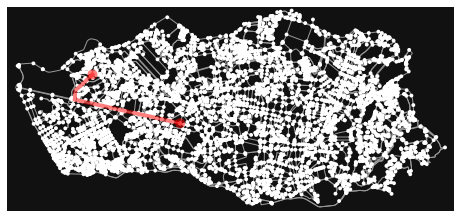

In [ ]:
# Alternative code
df2 = pd.read_csv('porto/mr_bimodel_processed.csv',sep=";")
trip_id = 1 # change to check different trajectory
if str(df2.cpath_nodes[trip_id]) != 'nan':
  R = [int(s) for s in df2.cpath_nodes[trip_id].strip('[]').split(sep=', ')]
  ox.plot_graph_route(G,R,route_color='r')
else:
  print('No matching result')

# Task 4

In [ ]:
!pip install pytrack
! pip install pytrack-lib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.4 MB 6.4 MB/s 
  Created wheel for pytrack: filename=Pytrack-1.0.1-py3-none-any.whl size=3390 sha256=dc6a4f8e5bc77a54842cd54329bd531bc80d674041f5fe7e5dc7974fe8d4e2ee
  Stored in directory: /root/.cache/pip/wheels/43/eb/01/6d96dd634f0f9b57305ccea326300596fcb1cb2b30bcbb23d2
Successfully built pytrack
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Import libraries
import numpy as np
import pandas as pd
import json
from pytrack.graph import graph, distance
from pytrack.analytics import visualization
from pytrack.matching import candidate, mpmatching_utils, mpmatching

In [ ]:
#Mount gdrive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Take path from csv and take each individual ID points
pathfile = '/content/drive/MyDrive/Urban2/Data/train/train.csv'
df = pd.read_csv(pathfile, nrows=1000)
df.to_csv('train-1000.csv')

df = pd.read_csv('train-1000.csv', usecols = ['POLYLINE'])
#Change the index number to get new points
points_df = df.iloc[10]['POLYLINE']  #Poor results on 4,
latitude = []
longitude = []
a = json.loads(points_df)
# print(a)
for long,lat in a:
  latitude.append(lat)
  longitude.append(long)
points = [(lat,long) for lat,long in zip(latitude,longitude)]
print(points)

[(41.148009, -8.619894), (41.14773, -8.620164), (41.148513, -8.62065), (41.150313, -8.62092), (41.151951, -8.621208), (41.153517, -8.621118), (41.155416, -8.620884), (41.155479, -8.620938), (41.155461, -8.620974), (41.155461, -8.621028), (41.155344, -8.619777), (41.155335, -8.619282), (41.155101, -8.618112), (41.154579, -8.61534), (41.153994, -8.613297), (41.153832, -8.612064), (41.155227, -8.611911), (41.156838, -8.611794), (41.157171, -8.610804), (41.15727, -8.61021), (41.157333, -8.609508), (41.157351, -8.60949)]


In [ ]:
# Create BBOX
north, east = np.max(np.array([*points]), 0)
south, west = np.min(np.array([*points]), 0)

# Extract road graph
G = graph.graph_from_bbox(*distance.enlarge_bbox(north, south, west, east, 500), simplify=True, network_type='drive')

Downloaded 596.68kB


In [ ]:
# Initialize maps
loc = (np.mean(latitude[:30]), np.mean(longitude[:30]))
maps = visualization.Map(location=loc, zoom_start=15)

In [ ]:
#Show extracted graph
maps.add_graph(G, plot_nodes=True)
maps

In [ ]:
# Extract candidates
G_interp, candidates = candidate.get_candidates(G, points, interp_dist=5, closest=True, radius=30)

# Plot results
maps.draw_candidates(candidates, 30)
maps

In [ ]:
# Extract trellis DAG graph
trellis = mpmatching_utils.create_trellis(candidates)

In [ ]:
# Perform the map-matching process
path_prob, predecessor = mpmatching.viterbi_search(G_interp, trellis, "start", "target")

In [ ]:
# Plot map-matching results
maps.draw_path(G_interp, trellis, predecessor)
maps

# Task 5

## Preparation

In [ ]:
import pandas as pd
import geopandas as gpd
import numpy as np

In [ ]:
# Functions
def path_to_list(path):
  if path == '[]':
    return []
  return [int(s) for s in path.strip('[]').split(sep=', ')]

def unique_edge(df, pathname):
  #pathname = 'cpath' or 'opath'
  df2 = df.apply(lambda row: path_to_list(row.loc[pathname]), axis=1)
  unique_edge_ids = [int(edge) for edge in np.unique(np.hstack(df2)).tolist()]
  return unique_edge_ids

def return_value(value):
  if type(value) == list:
    a = value[0]
    return a
  return value

def sort_dic_by_value(dic, reverse=True):
  sorted_dic = {}
  sorted_keys = sorted(dic, key=return_value(dic.get), reverse=reverse)
  for k in sorted_keys:
    sorted_dic[k] = dic[k]
  return sorted_dic

def top_n_edge_list(dic, n, reverse=True):
  sorted_dic = sort_dic_by_value(dic, reverse=reverse)
  return list(sorted_dic)[:n]

In [ ]:
# Read matching result
mr_file = 'porto/mr_bimodel.txt'
df = pd.read_csv(mr_file,sep=";")

## Task 5-1

In [ ]:
# Traverse counts of road segments
edge_traverse_count = dict.fromkeys(unique_edge(df, 'cpath'), 0)

for i in range(len(df)):
  cpath = path_to_list(df['cpath'][i])
  cpath_unique = list(np.unique(cpath))
  for edge in cpath_unique:
    edge_traverse_count[edge] += 1

In [ ]:
# Top 5 road segments traversed most often. Multiple visits from same trip count as 1
top_5_edge = top_n_edge_list(edge_traverse_count,5)
for edge in top_5_edge:
  print(f'Segment: {edge} Count: {edge_traverse_count[edge]}')

Segment: 6745 Count: 87
Segment: 1055 Count: 84
Segment: 940 Count: 72
Segment: 28 Count: 70
Segment: 29 Count: 67


## Task 5-2

In [ ]:
# Traverse time of road segments, regardless of number of visit time.
# dic format {edge_id: [ave_time, traj_count]}
edge_traverse_time = dict.fromkeys(unique_edge(df, 'opath'), [0,0])

for i in range(len(df)):
  opath = path_to_list(df['opath'][i])
  opath_unique = list(np.unique(opath))
  for edge in opath_unique:
    ave_time, traj_count = edge_traverse_time[edge]
    ave_time_new = (traj_count*ave_time+15*opath.count(edge))/(traj_count+1)
    traj_count_new = traj_count+1
    edge_traverse_time[edge] = [ave_time_new, traj_count_new]

In [ ]:
# Top 5 road segments traversed most often slowly
top_5_edge_slow = top_n_edge_list(edge_traverse_time,5)
for edge in top_5_edge_slow:
  print(f'Segment: {edge} Time: {edge_traverse_time[edge][0]} Traj Count: {edge_traverse_time[edge][1]}')

Segment: 5560 Time: 630.0 Traj Count: 1
Segment: 8225 Time: 615.0 Traj Count: 1
Segment: 10565 Time: 420.0 Traj Count: 2
Segment: 6265 Time: 300.0 Traj Count: 1
Segment: 883 Time: 285.0 Traj Count: 1


## Task 5-3

In [ ]:
import osmnx as ox
def plot_edge_osmnx(Rs, figsize=(20,10)):
  if Rs_1 == []:
    print('No matching result')
  else:
    colors = ox.plot.get_colors(len(Rs),cmap='gist_rainbow',start=0,stop=0.8,return_hex=True)
    ox.plot_graph_routes(G,Rs,route_colors=colors,figsize=figsize,orig_dest_size=200)

def plot_edge_folium(Rs):
  if Rs == []:
    print('No matching result')
  else:
    colors = ox.plot.get_colors(len(Rs),cmap='gist_rainbow',start=0,stop=0.8,return_hex=True)
    m = None
    i = 0
    for edge in Rs:
      m = ox.folium.plot_route_folium(G, edge, route_map=m, color=colors[i], weight=10)
      i += 1
    return m
  
def edge_node_list(edge_list):
  # Read road network
  network_gdf = gpd.read_file("porto/edges.shp")
  network_gdf.fid = network_gdf.fid.astype(int)

  if edge_list == []:
    return []
  nodes = []
  # find the nodes of given edge
  for edge in edge_list:
    u = int(network_gdf[network_gdf.fid.isin([edge])].u)
    v = int(network_gdf[network_gdf.fid.isin([edge])].v)
    nodes.append([u, v])
  return nodes

In [ ]:
# Download network. Skip if already downloaded
G = ox.graph_from_place('Porto, Portugal', network_type='drive')

### Visualization of task 5-1

In [ ]:
# Visualization of task 5-1
Rs_1 = edge_node_list(top_5_edge) 

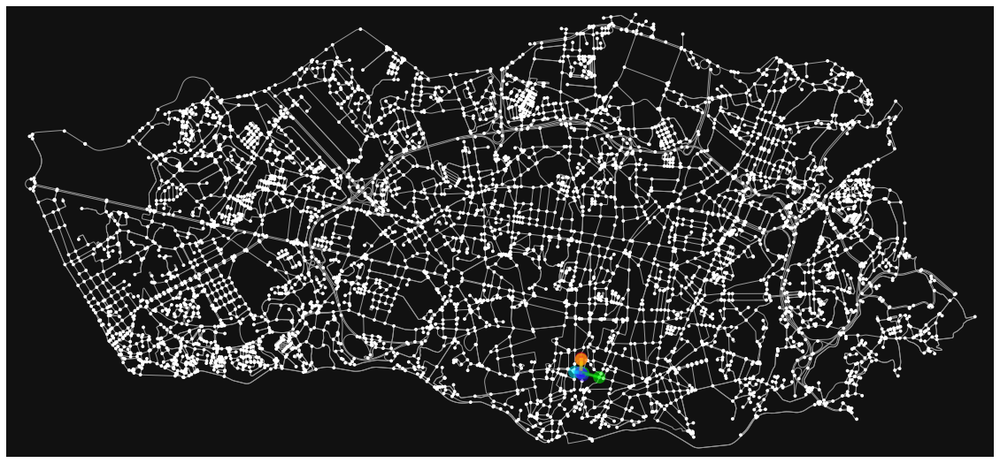

In [ ]:
# OSMnx plot
plot_edge_osmnx(Rs_1, figsize=(20,10))

In [ ]:
# Folium map
m = plot_edge_folium(Rs_1)
m

### Visualization of task 5-2

In [ ]:
# Visualization of task 5-2
Rs_2 = edge_node_list(top_5_edge_slow) 

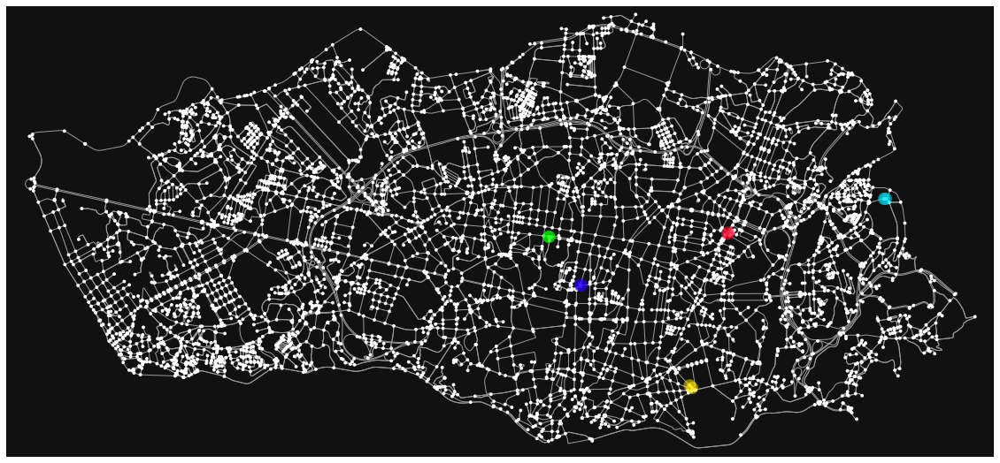

In [ ]:
# OSMnx plot
plot_edge_osmnx(Rs_2, figsize=(20,10))

In [ ]:
# Folium map
m = plot_edge_folium(Rs_2)
m